# Athletes Data Analysis

## About the Data

This data was sourced using SPARQL query on 17th August 2020. See the query below:

`PREFIX foaf: <http://xmlns.com/foaf/0.1/>
PREFIX dbo: <http://dbpedia.org/ontology/>
PREFIX dbr: <http://dbpedia.org/resource/>
PREFIX dbp: <http://dbpedia.org/property/>
PREFIX ling: <http://purl.org/linguistics/gold/>
SELECT DISTINCT ?a, ?dob, ?ht, ?hpn, ?g, ?name, ?c, ?intro
WHERE{
    ?a a dbo:Athlete; dbo:birthDate ?dob; dbo:height ?ht;
    ling:hypernym ?hpn; foaf:gender ?g; foaf:name ?name; dbo:abstract ?intro.
    OPTIONAL{?a  dbo:country ?c}
    FILTER(LANG(?name) = "en").
}`

The format and structures of the uris are evolving. As of 14th May, 2021, ling and foaf:gender are unavailable.

The updated query is :

`PREFIX foaf: <http://xmlns.com/foaf/0.1/>
PREFIX dbo: <http://dbpedia.org/ontology/>
PREFIX dbr: <http://dbpedia.org/resource/>
PREFIX dbp: <http://dbpedia.org/property/>
SELECT DISTINCT ?a, ?dob, ?ht, ?name, ?c, ?intro
WHERE{
    ?a a dbo:Athlete; dbo:birthDate ?dob; dbo:height ?ht;
    foaf:name ?name; dbo:abstract ?intro.
    OPTIONAL{?a  dbo:country ?c}
    FILTER(LANG(?name) = "en").
}`

The following analysis is for only demonstrating how DBpedia's data can be leveraged.

In [1]:
# User specification of file name
file_name = "athlete_17_08_2020_18_29_25.pkl"

In [2]:
path = "../Data/" + file_name
path

'../Data/athlete_17_08_2020_18_29_25.pkl'

In [3]:
#imports

# Basic imports
import pandas as pd
import numpy as np
from datetime import date 

#Visualisation imports
import matplotlib.pyplot as plt
import seaborn as sns



In [4]:
# Reading data from pickle file
df = pd.read_pickle(path)
df.head()

,a.value,dob.value,ht.value,hpn.value,g.xml:lang,g.value,name.xml:lang,name.value,c.value
0,http://dbpedia.org/resource/Gerard_van_Velde,1971-11-30,1.92,http://dbpedia.org/resource/Skater,en,male,en,Gerard van Velde,http://dbpedia.org/resource/Netherlands
1,http://dbpedia.org/resource/Gretha_Smit,1976-01-20,1.67,http://dbpedia.org/resource/Smit,en,female,en,Gretha Smit,http://dbpedia.org/resource/Netherlands
2,http://dbpedia.org/resource/Gretha_Smit,1976-1-20,1.67,http://dbpedia.org/resource/Smit,en,female,en,Gretha Smit,http://dbpedia.org/resource/Netherlands
3,http://dbpedia.org/resource/Jakko_Jan_Leeuwangh,1972-11-09,1.9,http://dbpedia.org/resource/Skater,en,male,en,Jakko Jan Leeuwangh,http://dbpedia.org/resource/Netherlands
4,http://dbpedia.org/resource/Jakko_Jan_Leeuwangh,1972-11-9,1.9,http://dbpedia.org/resource/Skater,en,male,en,Jakko Jan Leeuwangh,http://dbpedia.org/resource/Netherlands


## Data Explorations

In [5]:
# To check lang distributions in g.xml:lang and name.xml:lang
df['g.xml:lang'].value_counts() , df['name.xml:lang'].value_counts()

(en    280000
 Name: g.xml:lang, dtype: int64,
 en    280000
 Name: name.xml:lang, dtype: int64)

Since there are no other language apart from english, we can drop these columns.

In [6]:
df.drop(columns=['g.xml:lang', 'name.xml:lang'], inplace= True)
df.head()

,a.value,dob.value,ht.value,hpn.value,g.value,name.value,c.value
0,http://dbpedia.org/resource/Gerard_van_Velde,1971-11-30,1.92,http://dbpedia.org/resource/Skater,male,Gerard van Velde,http://dbpedia.org/resource/Netherlands
1,http://dbpedia.org/resource/Gretha_Smit,1976-01-20,1.67,http://dbpedia.org/resource/Smit,female,Gretha Smit,http://dbpedia.org/resource/Netherlands
2,http://dbpedia.org/resource/Gretha_Smit,1976-1-20,1.67,http://dbpedia.org/resource/Smit,female,Gretha Smit,http://dbpedia.org/resource/Netherlands
3,http://dbpedia.org/resource/Jakko_Jan_Leeuwangh,1972-11-09,1.9,http://dbpedia.org/resource/Skater,male,Jakko Jan Leeuwangh,http://dbpedia.org/resource/Netherlands
4,http://dbpedia.org/resource/Jakko_Jan_Leeuwangh,1972-11-9,1.9,http://dbpedia.org/resource/Skater,male,Jakko Jan Leeuwangh,http://dbpedia.org/resource/Netherlands


In [7]:
# Renaming the columns
col_names_list = ["db_resource_name", "dob", "height", "sport", "gender", "name", "country"]

If this link is referenced, we can see their properties. For example, if this link http://dbpedia.org/page/Gerard_van_Velde is visitied, the properties of this dbpedia resource would come up and these properties that have been scraped can also be verified.

In [8]:
df.columns = col_names_list
df.head()

,db_resource_name,dob,height,sport,gender,name,country
0,http://dbpedia.org/resource/Gerard_van_Velde,1971-11-30,1.92,http://dbpedia.org/resource/Skater,male,Gerard van Velde,http://dbpedia.org/resource/Netherlands
1,http://dbpedia.org/resource/Gretha_Smit,1976-01-20,1.67,http://dbpedia.org/resource/Smit,female,Gretha Smit,http://dbpedia.org/resource/Netherlands
2,http://dbpedia.org/resource/Gretha_Smit,1976-1-20,1.67,http://dbpedia.org/resource/Smit,female,Gretha Smit,http://dbpedia.org/resource/Netherlands
3,http://dbpedia.org/resource/Jakko_Jan_Leeuwangh,1972-11-09,1.9,http://dbpedia.org/resource/Skater,male,Jakko Jan Leeuwangh,http://dbpedia.org/resource/Netherlands
4,http://dbpedia.org/resource/Jakko_Jan_Leeuwangh,1972-11-9,1.9,http://dbpedia.org/resource/Skater,male,Jakko Jan Leeuwangh,http://dbpedia.org/resource/Netherlands


In [9]:
df.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 280000 entries, 0 to 9999
Data columns (total 7 columns):
 #   Column            Non-Null Count   Dtype 
---  ------            --------------   ----- 
 0   db_resource_name  280000 non-null  object
 1   dob               280000 non-null  object
 2   height            280000 non-null  object
 3   sport             280000 non-null  object
 4   gender            280000 non-null  object
 5   name              280000 non-null  object
 6   country           5402 non-null    object
dtypes: object(7)
memory usage: 17.1+ MB


**Obs:**

Country is has a lot o missing values

In [10]:
# To remove "http://dbpedia.org/resource/" from every column

for col in ["db_resource_name", "country", "sport"]:
    df[col] = df[col].str.replace("http://dbpedia.org/resource/", "")

df.head()

,db_resource_name,dob,height,sport,gender,name,country
0,Gerard_van_Velde,1971-11-30,1.92,Skater,male,Gerard van Velde,Netherlands
1,Gretha_Smit,1976-01-20,1.67,Smit,female,Gretha Smit,Netherlands
2,Gretha_Smit,1976-1-20,1.67,Smit,female,Gretha Smit,Netherlands
3,Jakko_Jan_Leeuwangh,1972-11-09,1.9,Skater,male,Jakko Jan Leeuwangh,Netherlands
4,Jakko_Jan_Leeuwangh,1972-11-9,1.9,Skater,male,Jakko Jan Leeuwangh,Netherlands


Date of Birth has inconsistant date format and therefore there are duplicates from the source i.e. DBpedia

In [11]:
df_cleaned = df.groupby('db_resource_name').first().reset_index()
df_cleaned.head()

,db_resource_name,dob,height,sport,gender,name,country
0,911_(wrestler),1957-01-22,2.032,Wrestler,male,911,NaN
1,A'Quonesia_Franklin,1985-09-29,1.6256,Coach,female,A'Quonesia Franklin,NaN
2,A'ala_Hubail,1982-06-25,1.7,Footballer,male,A'ala Hubail,NaN
3,A'dia_Mathies,1991-03-18,1.7526,Player,female,A'dia Mathies,NaN
4,A.J._Matthews,1988-01-23,1.8288,Artist,male,A.J. Matthews,NaN


In [12]:
# Check if there are any duplicates

len(df.db_resource_name.unique()) == len(df_cleaned)

True

**Obs**

Got rid of all the duplicates here

In [13]:
df_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 108491 entries, 0 to 108490
Data columns (total 7 columns):
 #   Column            Non-Null Count   Dtype 
---  ------            --------------   ----- 
 0   db_resource_name  108491 non-null  object
 1   dob               108491 non-null  object
 2   height            108491 non-null  object
 3   sport             108491 non-null  object
 4   gender            108491 non-null  object
 5   name              108491 non-null  object
 6   country           3311 non-null    object
dtypes: object(7)
memory usage: 5.8+ MB


In [14]:
df_cleaned.sport.value_counts()

Footballer    35160
Player        33300
Midfielder     2906
Swimmer        2791
Defender       2593
              ...  
Paralympic        1
Chair             1
Owner             1
Hyden             1
Muntasser         1
Name: sport, Length: 1964, dtype: int64

## Wordcloud of Sports by Male and Female

In [15]:
sport_count_male = dict(df_cleaned[df_cleaned['gender'] == 'male'].sport.value_counts())

In [16]:
sport_count_female = dict(df_cleaned[df_cleaned['gender'] == 'female'].sport.value_counts())

In [17]:
from wordcloud import WordCloud

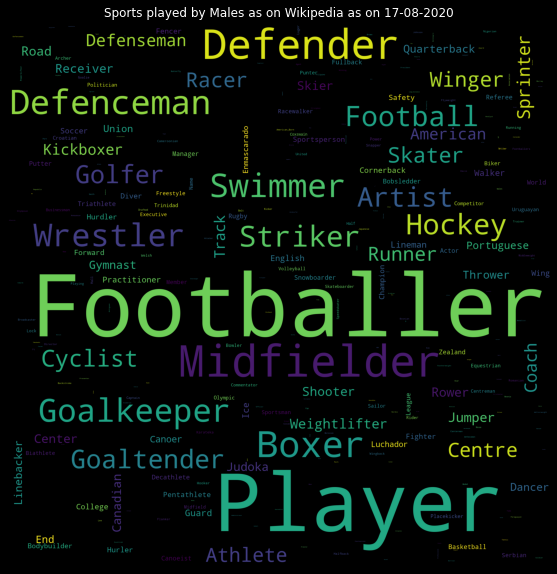

In [18]:
wordcloud = WordCloud(
    width=2000,
    height=2000,
    max_words=500,
    background_color='black',
    font_step=1,
    relative_scaling=0.5).generate_from_frequencies(sport_count_male)

plt.style.use('dark_background')
plt.figure(figsize = (10, 10), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.title('Sports played by Males as on Wikipedia as on 17-08-2020')
plt.show()

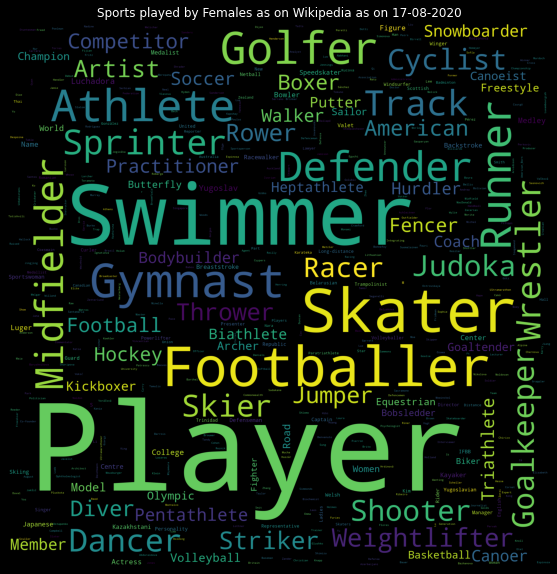

In [19]:
wordcloud = WordCloud(
    width=2000,
    height=2000,
    max_words=500,
    background_color='black',
    font_step=1,
    relative_scaling=0.5).generate_from_frequencies(sport_count_female)

plt.style.use('dark_background')
plt.figure(figsize = (10, 10), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.title('Sports played by Females as on Wikipedia as on 17-08-2020')
plt.show()

## Gender Count

In [20]:
import plotly.express as px

In [21]:
fig = px.bar(df_cleaned,
             y=dict(df_cleaned.gender.value_counts()).values(),
             x=dict(df_cleaned.gender.value_counts()).keys(),
             title='Gender Distribution'
            )

fig.show()

## Heights Distribution by Gender

In [22]:
df_cleaned.dtypes

db_resource_name    object
dob                 object
height              object
sport               object
gender              object
name                object
country             object
dtype: object

In [23]:
df_cleaned['height'] = df_cleaned['height'].astype(float)

**info** 

I tried plotting this earlier but the boxplot did not seem alright. So, figured out that the column datatype was object so the boxplot was weird. Hence, changed it to float type.

In [24]:
df_cleaned.dtypes

db_resource_name     object
dob                  object
height              float64
sport                object
gender               object
name                 object
country              object
dtype: object

In [25]:
fig = px.box(df_cleaned, y='height', x='gender')
fig.show()

**Obs**

The outliers are definitely wrong numbers. I am assuming they are not in the right scale. So I divided them by 100, the ones which are more than 100. Height, possibly cannot be as low as .5 m

In [26]:
df_cleaned.loc[df_cleaned['height']>100, 'height']/=100

In [27]:
df_cleaned[df_cleaned['height'] == 47.0662]

,db_resource_name,dob,height,sport,gender,name,country
58384,Lauri_Kärmeniemi,1991-04-17,47.0662,Defenceman,male,Lauri Kärmeniemi,NaN


In [28]:
# Replace the height with 1.8 from the internet
# Looks like it is updated as of 14.5.2021

df_cleaned.loc[df_cleaned['height'] == 47.0662, 'height'] = 1.8

In [29]:
fig = px.box(df_cleaned, y='height')
fig.show()

In [30]:
df_cleaned.loc[df_cleaned['height'] < 1]

,db_resource_name,dob,height,sport,gender,name,country
233,Abdelali_Mhamdi,1991-11-29,0.0000,Football,male,Abdelali Mhamdi,NaN
335,Abdollah_Veisi,1971-03-22,0.0000,Player,male,Abdollah Veisi,NaN
603,Aboubakar_Mahadi,1993-11-29,0.0184,Striker,male,Aboubakar Mahadi,NaN
1271,Adriana_Barré,1995-04-04,0.0000,Footballer,female,Adriana Barré,NaN
1558,Ahmad_Hassanzadeh,1985-01-31,0.0174,Footballer,male,Ahmad Hassanzadeh,NaN
...,...,...,...,...,...,...,...
106680,Yum_Dong-kyun,1950-11-10,0.6858,Boxer,male,Yum Dong-kyun,NaN
107481,Ziv_Kalontarov,1997-01-15,0.0000,Swimmer,male,Ziv Kalontarov,NaN
107616,Zou_Shiming,1981-05-18,0.0000,Boxer,male,Zou Shiming,NaN
107656,"Zsolt_Nagy_(footballer,_born_1993)",1993-05-25,0.0000,Footballer,male,Zsolt Nagy,NaN


In [31]:
df_cleaned.loc[df_cleaned['height'] > 2.5]

,db_resource_name,dob,height,sport,gender,name,country
13324,Bobby_Kirk_(ice_hockey),1909-08-08,2.667,Player,male,Bobby Kirk,NaN
32297,Fiontán_Ó_Curraoin,1992-1-1,3.000,Footballer,male,Fiontán Ó Curraoin,NaN
67443,Matt_Miller_(quarterback),1972-01-05,3.683,Quarterback,male,Matt Miller,NaN
96280,Tahir_Whitehead,1990-04-02,3.429,Linebacker,male,Tahir Whitehead,NaN


In [36]:
df_cleaned.loc[df_cleaned['height'] < 1, 'height'] *= 100

In [37]:
fig = px.box(df_cleaned, y='height')
fig.show()

In [44]:
fig = px.bar(df_cleaned,
             y=list(dict(df_cleaned.country.value_counts()).values())[:20],
             x=list(dict(df_cleaned.country.value_counts()).keys())[:20],
             title='Top Twenty Countries in the Dataset'
            )

fig.show()

In [47]:
fig = px.bar(df_cleaned,
             y=list(dict(df_cleaned.country.value_counts()).values())[-20:],
             x=list(dict(df_cleaned.country.value_counts()).keys())[-20:],
             title='Bottom Twenty Countries in the Dataset'
            )

fig.show()

## Final Thoughts
